In [35]:
import sklearn
import pandas as pd
import numpy as np
import seaborn as sns
from fbprophet import Prophet
sns.set()

In [2]:
data = pd.read_excel("StockPrices.xlsx", "Data-Prices")

In [3]:
dates = data["Date"]

In [16]:
import math
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
import matplotlib.pyplot as plt
class StockManager:

    
    def __init__(self, dates, prices, period, transaction_cost, prediction_function):
        self.reset()
        self.dates = dates
        self.prices = prices
        
        self.period = period
        self.prediction_function = prediction_function
        self.t_c = transaction_cost
    
    def buy(self, cost):
        self.stored_stock += 1
        self.incurred_cost += cost 
        
    def sell(self, p_t, total_transaction_cost):
        if self.stored_stock > 0:
            self.incurred_cost += total_transaction_cost
            self.stored_money += p_t
            self.stored_stock -= 1
            
    def run_day(self):
        p_t1 = self.prediction_function(self.dates, self.prices, self.t, self.period)
        p_t = self.prices[self.t]
        
        if self.prices[self.t + 1] < p_t:
            self.fall += 1
            if p_t1 < p_t:
                self.predict_fall += 1
        elif self.prices[self.t + 1] > p_t:
            self.rise += 1
            if p_t1 > p_t:
                self.predict_rise += 1
            
        
        self.predictions.append(p_t1)
        
        total_transaction_cost = p_t * self.t_c
        
        if p_t1 > p_t + total_transaction_cost:
            self.buy(p_t + total_transaction_cost)
        elif p_t1 < p_t - total_transaction_cost:
            self.sell(p_t, total_transaction_cost)
        
    
    def step(self, dt):
        for i in range(dt):
            self.run_day()
            self.t += 1
        
    def reset(self, start_t = 0):
        self.stored_stock = 1
        self.incurred_cost = 0
        self.stored_money = 0
        self.t = start_t
        self.t_i = start_t
        
        self.rise = 0
        self.fall = 0
        
        self.predict_rise = 0
        self.predict_fall = 0
        
        self.predictions = list()
        
    def get_return(self):
        net_cost = self.incurred_cost + self.prices[self.t_i]
        return (self.stored_stock * self.prices[self.t] + self.stored_money - net_cost) / net_cost 
    def get_direction_accuracy(self):
        return self.predict_rise / self.rise, self.predict_fall / self.fall, (self.predict_rise + self.predict_fall) / (self.rise + self.fall)
    def get_errors(self):
        rmse = mean_squared_error(self.prices[self.t_i:self.t], self.predictions, squared=False)
        mape = mean_absolute_percentage_error(self.prices[self.t_i:self.t], self.predictions)
        mae = mean_absolute_error(self.prices[self.t_i:self.t], self.predictions)
        return rmse, mape, mae
    def plot_predictions(self, plt):
        x_data = np.arange(self.t - self.t_i)
        plt.plot(x_data, self.predictions, label="Prediction")
        plt.plot(x_data, self.prices[self.t_i:self.t], label="Real")
        plt.legend()
        

In [11]:
y = data["ABEV3"]

In [12]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
from sklearn import svm
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from keras.wrappers.scikit_learn import KerasRegressor
import matplotlib.pyplot as plt
import six
import joblib
import sys
sys.modules['sklearn.externals.six'] = six
sys.modules['sklearn.externals.joblib'] = joblib
import pmdarima as pm
from fbprophet import Prophet

def make_combined_data(prices, t, period):
    # scale the data with a standard scaler
    return [[i, prices[i]] for i in range(t - period, t + 1)]


def prophet_prediction(dates, prices, t, period):
    m = Prophet(daily_seasonality=True)
    m.fit(pd.DataFrame({"ds": dates[t - (period) : t], "y" : prices[t - (period) : t]}))
    predictions = m.predict(m.make_future_dataframe(periods=1))[-1:]
    return round(predictions["yhat"].iloc[0], 4)
def arima_prediction(dates, prices, t, period):
     # splits data into training and testing
    train = prices[t - period : t]
    # declares auto-arima model and trains it on the training data
    model = pm.auto_arima(train, d=1, seasonal=False, stepwise=True,
                     suppress_warnings=True, error_action="ignore", max_p=6,
                     max_order=None, trace=True)
    
    # forecasts 
    forecasts = model.predict(n_periods=1, return_conf_int=True)
    
    # returns calculated metrics
    return forecasts[0] 
def mlp_prediction(dates,prices,t,period):
    hidden_layer_sizes = [(1,),(50,), (100,)]
    activation = ["identity", "logistic", "tanh", "relu"]
    solver = ["lbfgs", "sgd", "adam"]
    alpha = [0.00005,0.0005]
    mlp_grid = {"hidden_layer_sizes": hidden_layer_sizes, "activation": activation, "solver": solver, "alpha": alpha}
    mlp = MLPRegressor(random_state = 1, max_iter=2000)
    mlp_search = GridSearchCV(mlp, mlp_grid, cv=3)
    
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(make_combined_data(prices, t, period))
    
    x_train, y_train = scaled_data[:-1, 0], scaled_data[:-1, 1]
    mlp_search.fit(x_train.reshape(-1, 1), y_train)
    mlp_final = mlp_search.best_estimator_
    combined_output = [[scaled_data[-1:, 0], mlp_final.predict(scaled_data[-1:, 0].reshape(1, -1))[0]]]
    
    output = scaler.inverse_transform(combined_output)
    
    
    return output[:, 1][0]
def svr_prediction(dates, prices, t, period):
    kernel = ['poly','sigmoid','rbf']
    C = [0.01, 0.025, 0.05, 0.075, 0.1, 0.25, 0.5, 0.75, 1, 2.5, 5, 7.5, 10]
    gamma = ["scale", "auto", 0.01, 0.025, 0.05, 0.075, 0.1, 0.25, 0.5, .75, 1]
    epsilon = [0.01, 0.025, 0.05, 0.075, 0.1, .25, 0.5, .75, 1]
    shrinking = [True, False]
    svm_grid = {'kernel':kernel,'C':C,'gamma':gamma,'epsilon':epsilon,'shrinking':shrinking}
    SVM = svm.SVR()
    svm_search = GridSearchCV(SVM,svm_grid,cv=3)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(make_combined_data(prices, t, period))
    
    # get training data
    x_train, y_train = scaled_data[:-1, 0], scaled_data[:-1, 1]
    
    # fit SVM Model
    svm_search.fit(x_train.reshape(-1, 1), y_train)
    svm_final = svm_search.best_estimator_
    
    # reverse the previous scale
    combined_output = [[scaled_data[-1:, 0], svm_final.predict(scaled_data[-1:, 0].reshape(1, -1))[0]]]
    
    output = scaler.inverse_transform(combined_output)
    # get outputs
    prediction = output[:, 1]
    return prediction[0]

def lstm_prediction(dates, prices, t, period):
    def create_model(optimizer, bias, activation, units, recurrent_activation, kernel_initializer):
        model = Sequential()
        
        model.add(LSTM(units=units, return_sequences=True, use_bias = bias, activation=activation, recurrent_activation = recurrent_activation, kernel_initializer = kernel_initializer))
        model.add(Dropout(0.2))
            
        model.add(Dense(units = 1, activation = activation))
        model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
        return model
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(make_combined_data(prices, t, period))
    
    # get training data
    x_train, y_train = scaled_data[:-1, 0], scaled_data[:-1, 1]
#     print(x_train.shape)
    x_train = np.expand_dims(x_train, 1)
#     y_train = np.expand_dims(y_train, 2)
    x_train = x_train.reshape((x_train.shape[0], x_train.shape[1], 1))
    model = KerasRegressor(build_fn=create_model, epochs = 100, batch_size=1, verbose=0)
    optimizer = ['SGD', 'Adam']
    activation = ["relu", "sigmoid"]
    bias = [True]
    units = [50]
    kernel_initializer = ["glorot_uniform"]
    param_grid = {"optimizer":optimizer, "units" : units, "activation" : activation, "recurrent_activation" : activation, "kernel_initializer" : kernel_initializer, "bias" : bias,

                 }
    
    lstm_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3)
    lstm_search.fit(x_train, y_train)
    lstm_final = lstm_search.best_estimator_
    prediction = model.predict(scaled_data[-1:, 0])
    return prediction

In [13]:
data["ABEV3"][245]

19.469627721

In [14]:
data["ABEV3"][246]

19.844747428

In [15]:
arima_prediction(dates, data["ABEV3"], 246, 21)

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-7.466, BIC=-1.492, Time=0.309 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-12.741, BIC=-10.749, Time=0.010 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-10.818, BIC=-7.831, Time=0.019 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-10.799, BIC=-7.812, Time=0.023 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=-13.078, BIC=-12.082, Time=0.008 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=-9.783, BIC=-5.800, Time=0.110 seconds
Total fit time: 0.481 seconds


array([19.46962772])

In [216]:
mlp_prediction(dates, data["ABEV3"], 246, 21)

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


19.452265308939413

In [103]:
svr_prediction(dates, data["ABEV3"], 246, 21)

C:\Users\piphi\anaconda3\lib\site-packages\numpy\core\_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


19.358380667687427

In [44]:
prophet_prediction(dates, data["ABEV3"], 246, 21)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


19.6514

In [45]:
prophet_abev_manager = StockManager(dates, data["ABEV3"], 21, .01, prophet_prediction)
svr_abev_manager = StockManager(dates, data["ABEV3"], 21, .01, svr_prediction)
arima_abev_manager = StockManager(dates, data["ABEV3"], 21, .01, arima_prediction)
mlp_abev_manager = StockManager(dates, data["ABEV3"], 21, .01, mlp_prediction)

In [19]:
import datetime
date = datetime.datetime(2020, 1, 2)
t = dates[dates.isin([date])].index.to_list()[0]
end_date = datetime.datetime(2020, 12, 28)
t_f = dates[dates.isin([end_date])].index.to_list()[0]

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-2.102, BIC=3.873, Time=0.254 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-4.023, BIC=-2.031, Time=0.012 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-2.422, BIC=0.565, Time=0.029 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-5.912, BIC=-2.925, Time=0.119 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=-4.570, BIC=-3.574, Time=0.011 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=-4.538, BIC=-0.555, Time=0.155 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 0.583 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=Tru

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

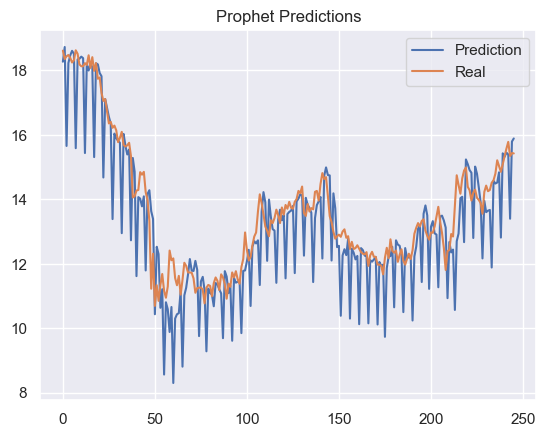

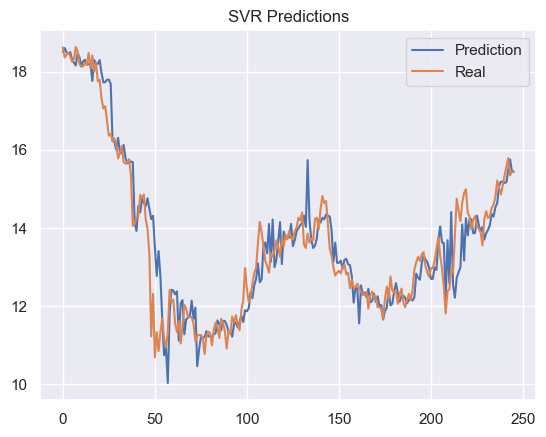

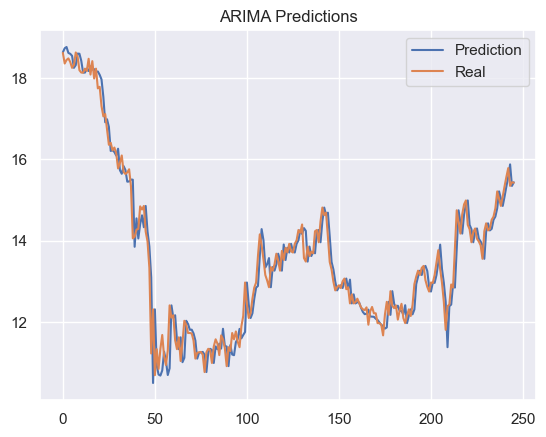

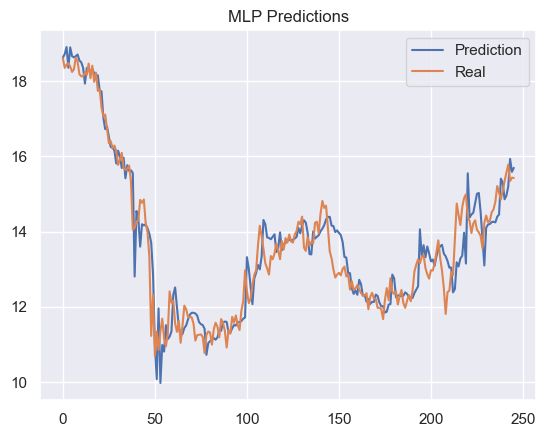

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=16.935, BIC=22.909, Time=0.066 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=14.174, BIC=16.165, Time=0.010 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=14.961, BIC=17.949, Time=0.019 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=15.389, BIC=18.377, Time=0.019 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=13.461, BIC=14.457, Time=0.010 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=16.604, BIC=20.587, Time=0.030 seconds
Total fit time: 0.157 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=16.766, BIC=22.740, Time=0.198 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=20.298, BIC=22.290, Time=0.013 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=22.139, BIC=25.127, Time=0.021 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=22.122, BIC=25.109, Time=0.020 seconds
Fit

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

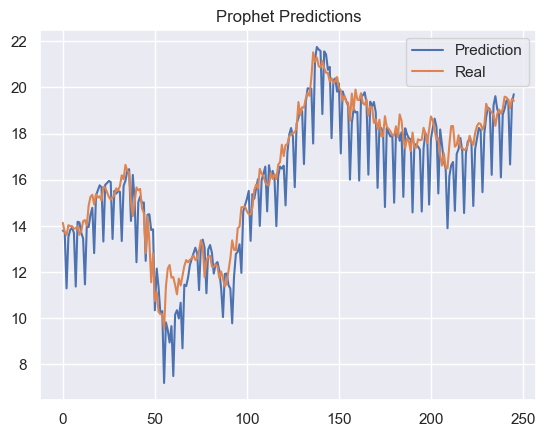

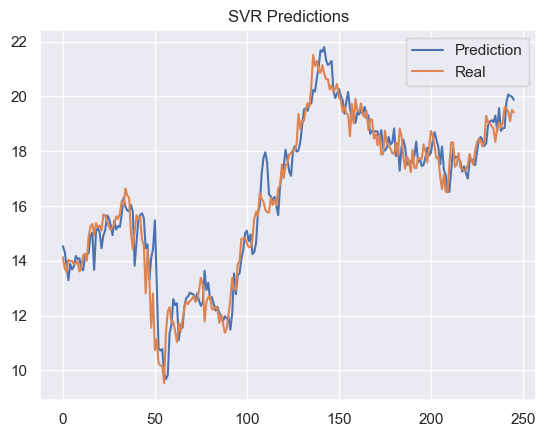

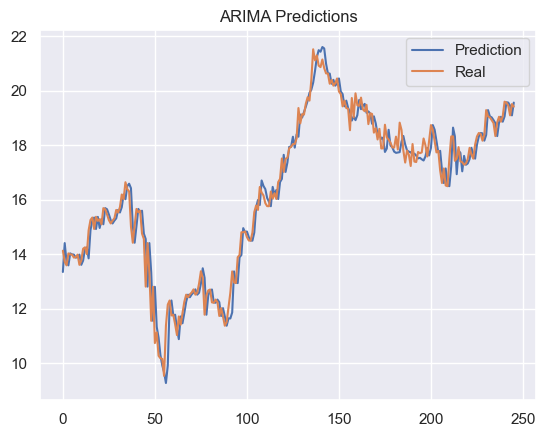

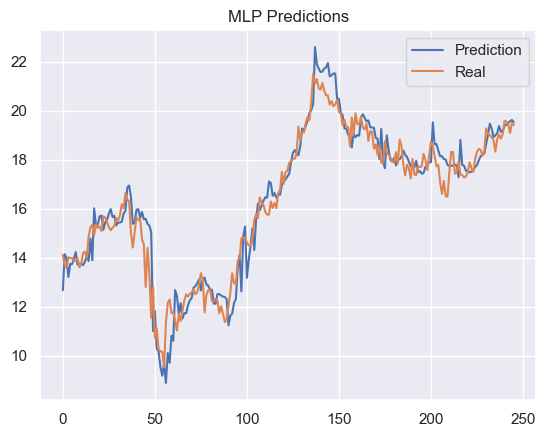

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=17.183, BIC=23.158, Time=0.075 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=14.705, BIC=16.697, Time=0.013 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=16.688, BIC=19.675, Time=0.020 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=16.495, BIC=19.483, Time=0.024 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=16.260, BIC=17.255, Time=0.010 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=16.107, BIC=20.090, Time=0.055 seconds
Total fit time: 0.198 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=20.810, BIC=26.785, Time=0.146 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=21.624, BIC=23.615, Time=0.018 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=23.585, BIC=26.572, Time=0.021 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=23.310, BIC=26.297, Time=0.036 seconds
Fit

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

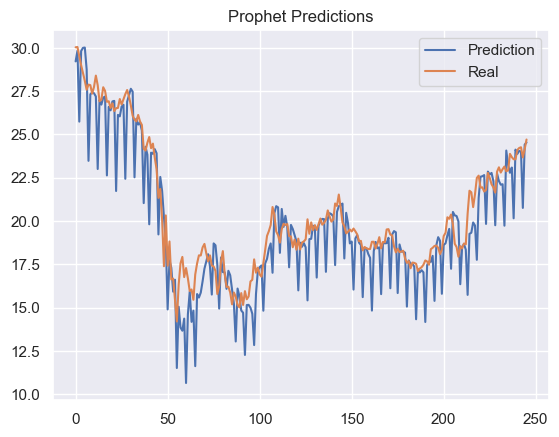

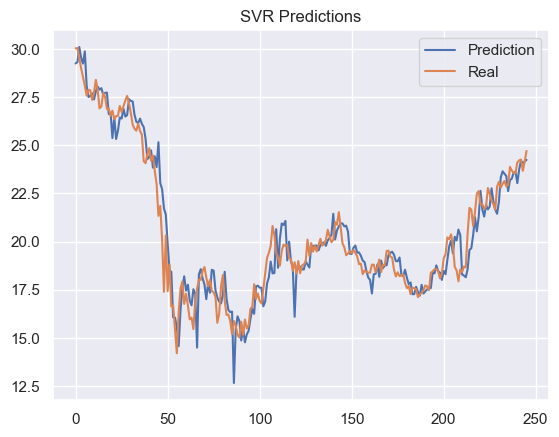

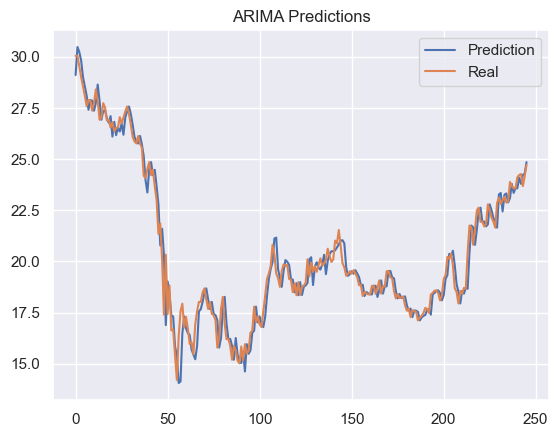

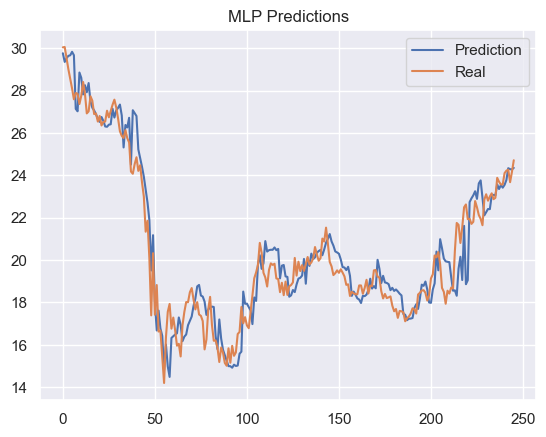

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-24.958, BIC=-18.984, Time=0.250 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-22.389, BIC=-20.397, Time=0.024 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-22.282, BIC=-19.294, Time=0.052 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-29.319, BIC=-26.332, Time=0.131 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=-22.379, BIC=-21.384, Time=0.025 seconds
Fit ARIMA(1,1,2)x(0,0,0,0) [intercept=True]; AIC=-26.661, BIC=-21.682, Time=0.270 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA(2,1,1)x(0,0,0,0) [intercept=True]; AIC=-26.787, BIC=-21.809, Time=0.376 seconds
Near non-i

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

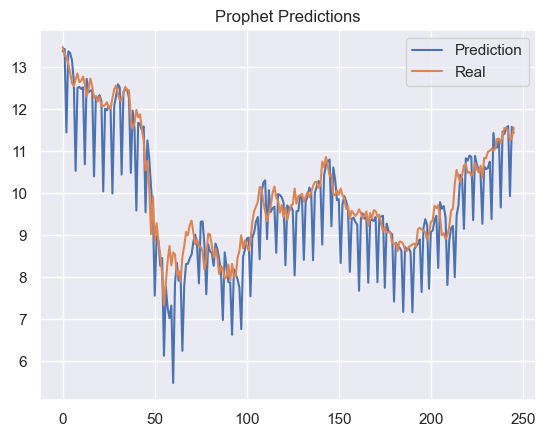

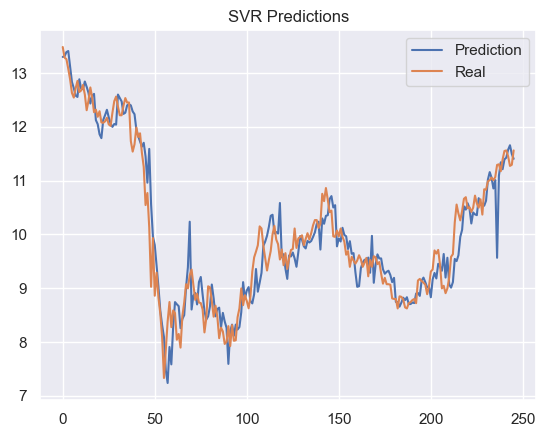

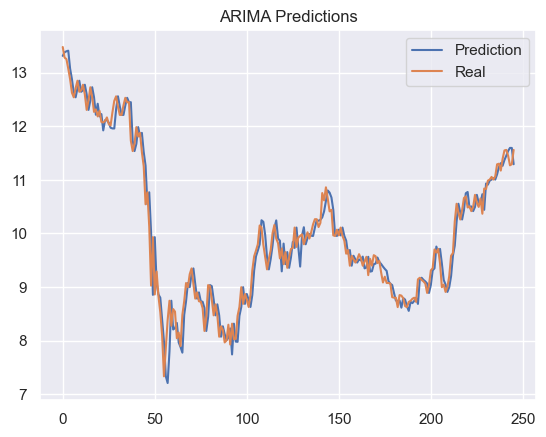

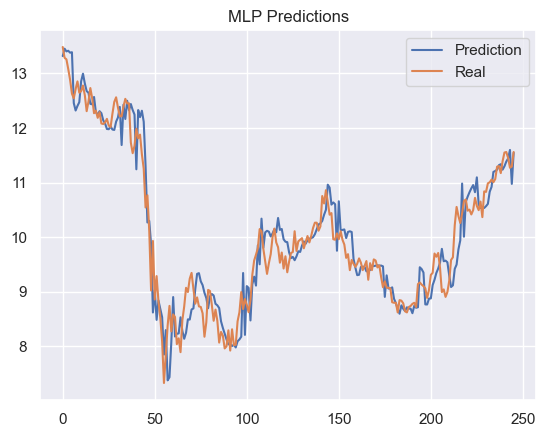

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=30.204, BIC=36.178, Time=0.493 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=31.818, BIC=33.809, Time=0.048 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=32.061, BIC=35.049, Time=0.033 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=31.275, BIC=34.262, Time=0.039 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=31.020, BIC=32.016, Time=0.013 seconds
Fit ARIMA(1,1,2)x(0,0,0,0) [intercept=True]; AIC=34.938, BIC=39.916, Time=0.098 seconds
Fit ARIMA(2,1,1)x(0,0,0,0) [intercept=True]; AIC=34.122, BIC=39.100, Time=0.145 seconds
Fit ARIMA(3,1,2)x(0,0,0,0) [intercept=True]; AIC=32.024, BIC=38.994, Time=0.284 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA(2,1,3)x(0,0,0,0) [intercept=True]; AIC=32.102, BIC=39.072, Time=0.267 seconds
Near n

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

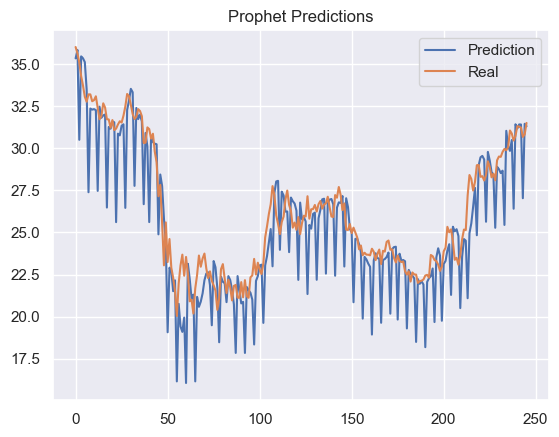

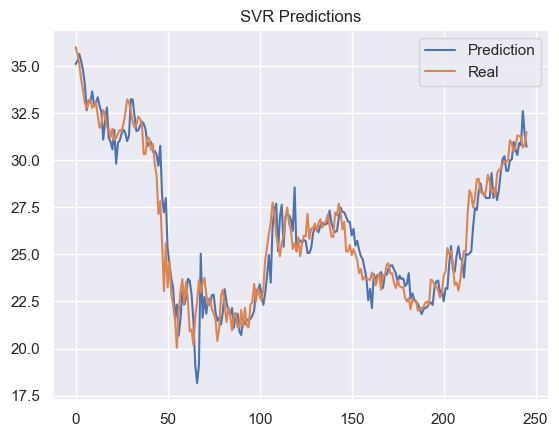

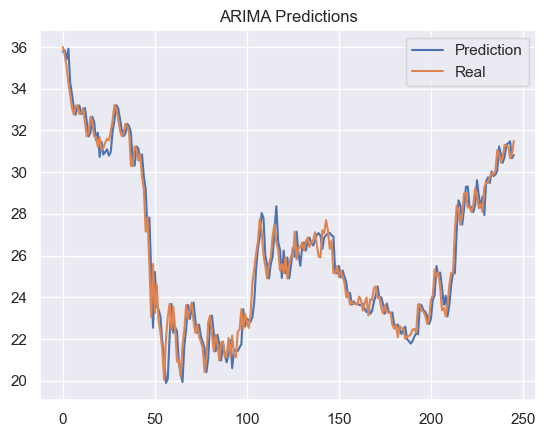

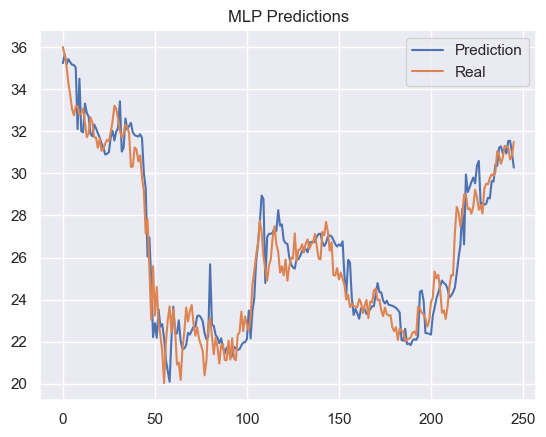

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-7.585, BIC=-1.610, Time=0.485 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-11.714, BIC=-9.722, Time=0.017 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-10.117, BIC=-7.130, Time=0.023 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-10.214, BIC=-7.227, Time=0.089 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=-13.207, BIC=-12.211, Time=0.008 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=-10.699, BIC=-6.716, Time=0.163 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 0.788 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-3.885, BIC=2.089, Time=0.218 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-8.036, BIC=-6.044, Time=0.022 seconds
Fit ARIMA(1,1,0)

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\piphi\AppData\Roaming\Python\Python37\site-packages\sklearn\neural_network\_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\piphi\AppData\Roaming\Python\Python37\site-packages\sklearn\neural_network\_multilayer_perceptron.py:617: ConvergenceWarning: Stochastic Optimizer: Maximum iteratio

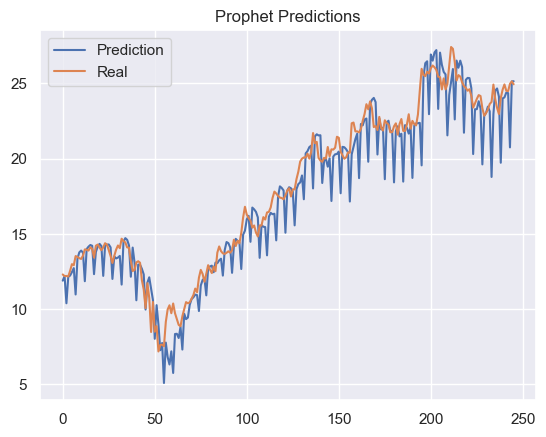

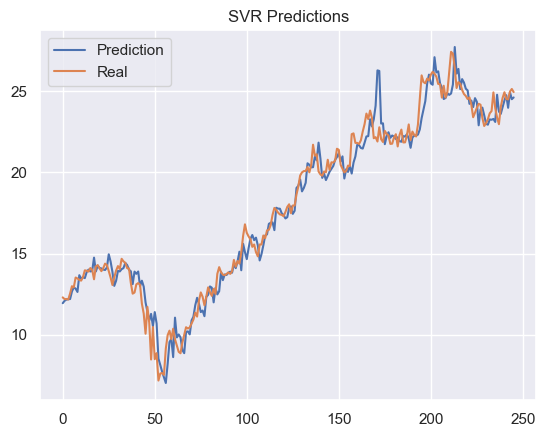

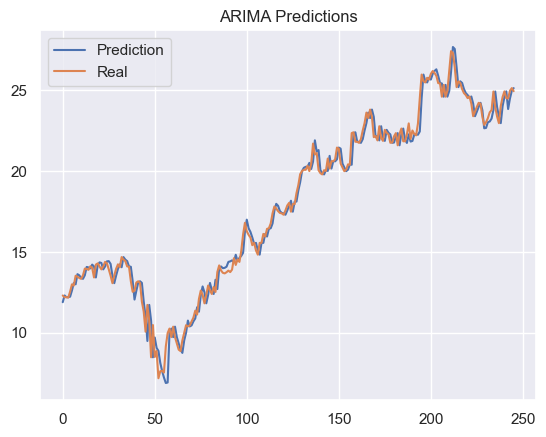

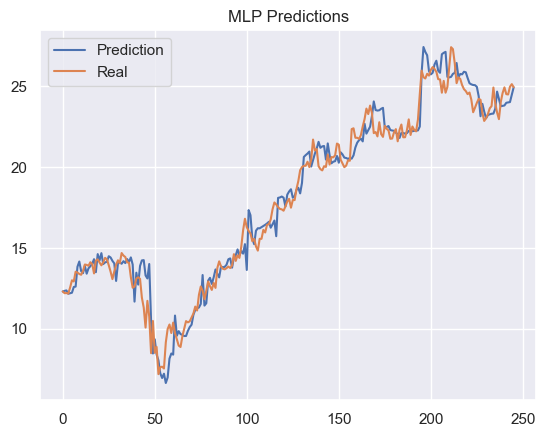

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=34.582, BIC=40.556, Time=0.524 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=30.507, BIC=32.498, Time=0.033 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=32.495, BIC=35.482, Time=0.043 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=32.478, BIC=35.465, Time=0.045 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=28.542, BIC=29.538, Time=0.025 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=30.623, BIC=34.605, Time=0.152 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 0.832 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=34.424, BIC=40.398, Time=0.151 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=31.983, BIC=33.975, Time=0.031 seconds
Fit ARIMA(1,1,0)x(0,0

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
C:\Users\piphi\AppData\Roaming\Python\Python37\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: Visi

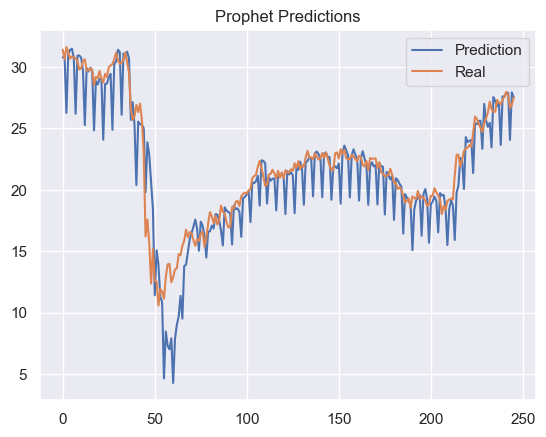

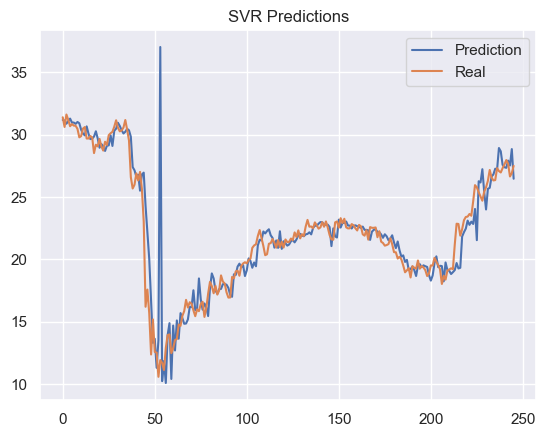

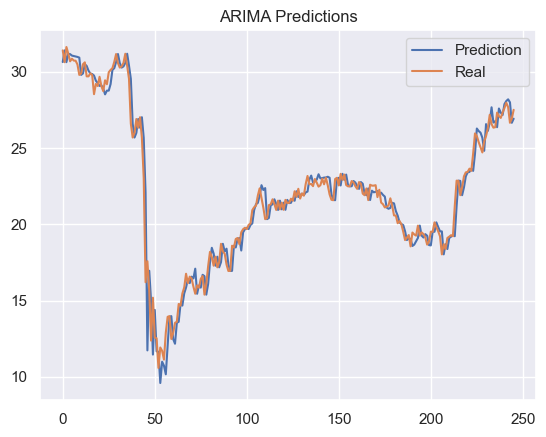

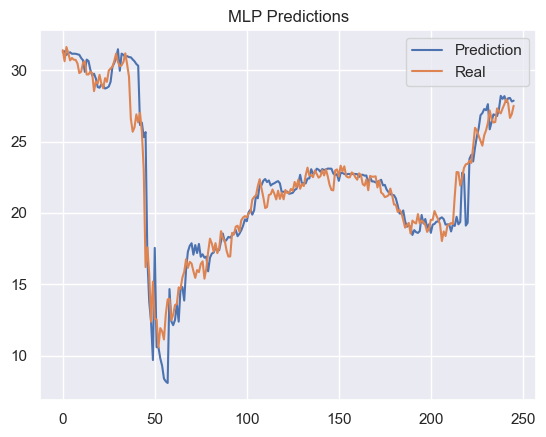

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=25.099, BIC=31.073, Time=0.246 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=24.884, BIC=26.875, Time=0.015 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=26.787, BIC=29.774, Time=0.017 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=26.602, BIC=29.589, Time=0.026 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=23.192, BIC=24.188, Time=0.011 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=25.062, BIC=29.045, Time=0.076 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 0.393 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=25.402, BIC=31.376, Time=0.121 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=24.860, BIC=26.852, Time=0.023 seconds
Fit ARIMA(1,1,0)x(0,0

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

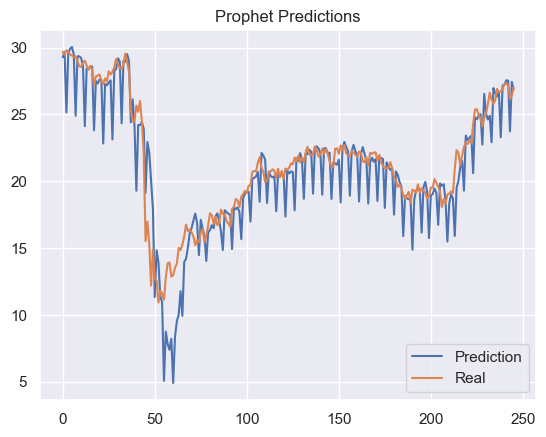

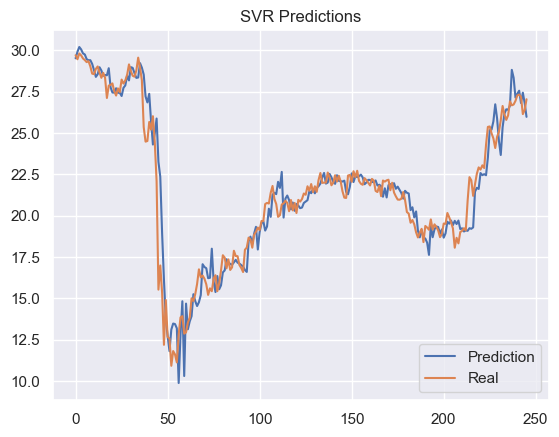

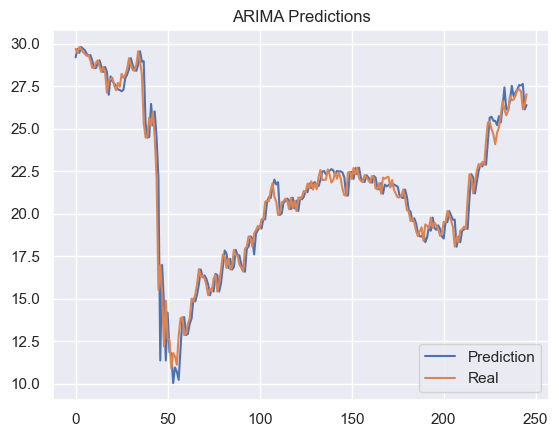

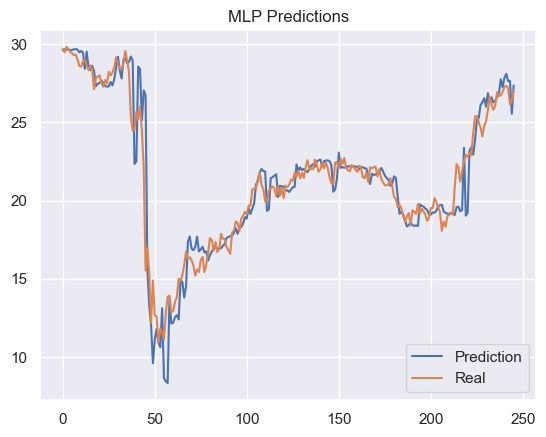

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=36.310, BIC=42.284, Time=0.220 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=32.302, BIC=34.294, Time=0.021 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=31.845, BIC=34.832, Time=0.022 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=29.434, BIC=32.421, Time=0.070 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=33.211, BIC=34.207, Time=0.009 seconds
Fit ARIMA(2,1,0)x(0,0,0,0) [intercept=True]; AIC=33.716, BIC=37.699, Time=0.044 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=30.043, BIC=34.026, Time=0.126 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA(2,1,1)x(0,0,0,

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

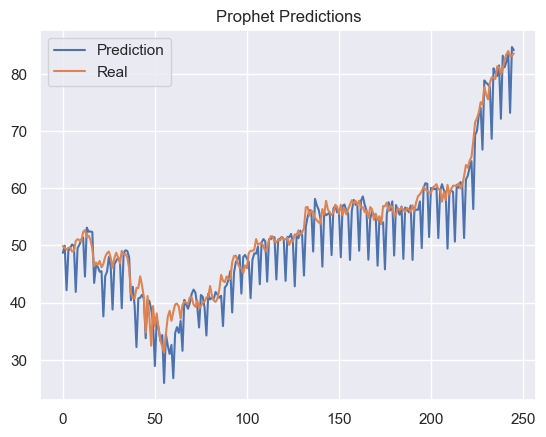

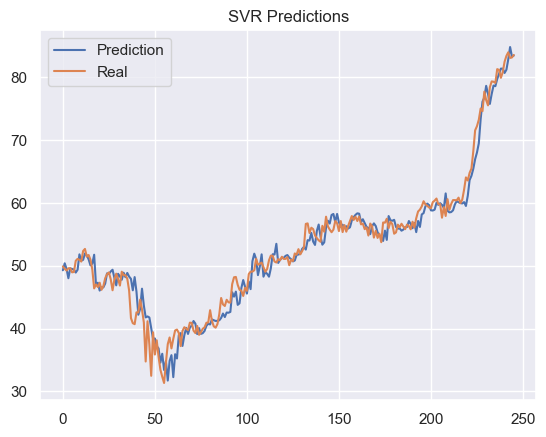

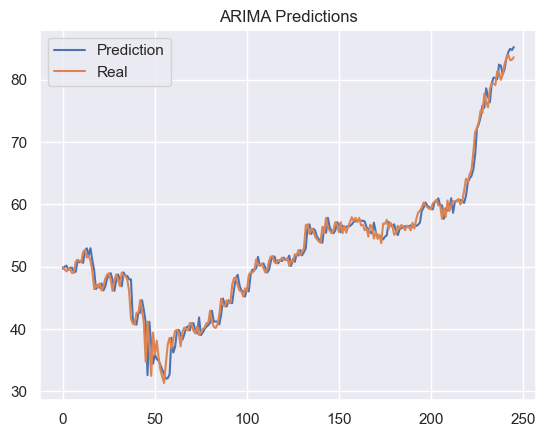

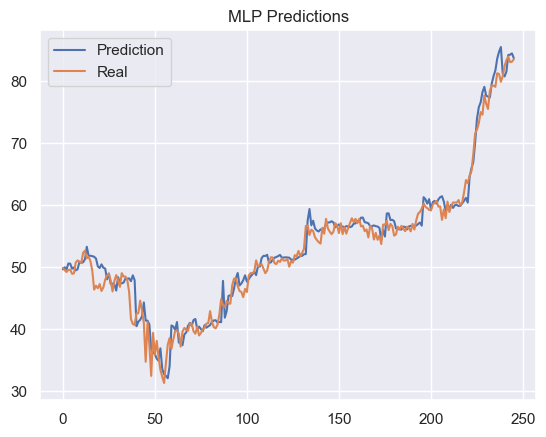

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=14.380, BIC=20.354, Time=0.210 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=11.872, BIC=13.863, Time=0.023 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=13.761, BIC=16.748, Time=0.042 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=13.223, BIC=16.210, Time=0.033 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=13.424, BIC=14.420, Time=0.019 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=13.700, BIC=17.683, Time=0.117 seconds
Total fit time: 0.453 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=8.652, BIC=14.627, Time=0.220 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=10.613, BIC=12.605, Time=0.020 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=12.470, BIC=15.457, Time=0.027 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=11.882, BIC=14.869, Time=0.030 seconds
Fit 

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

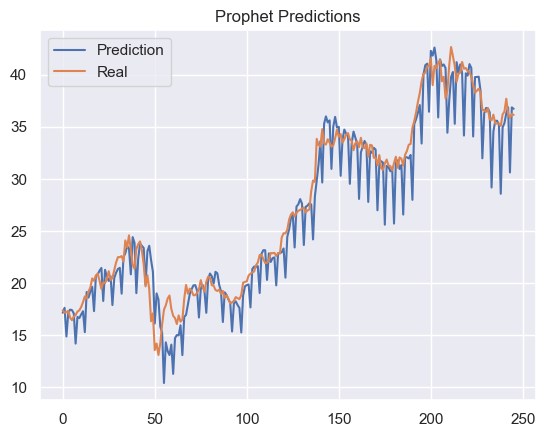

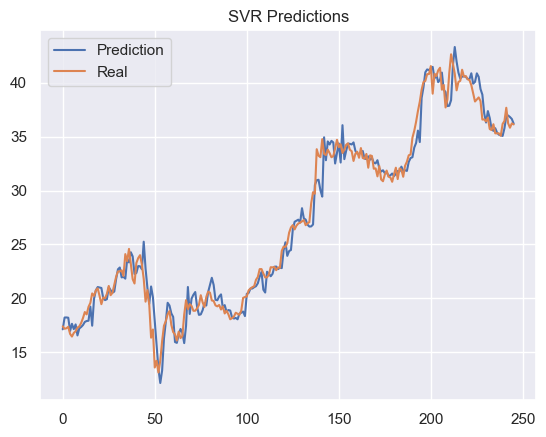

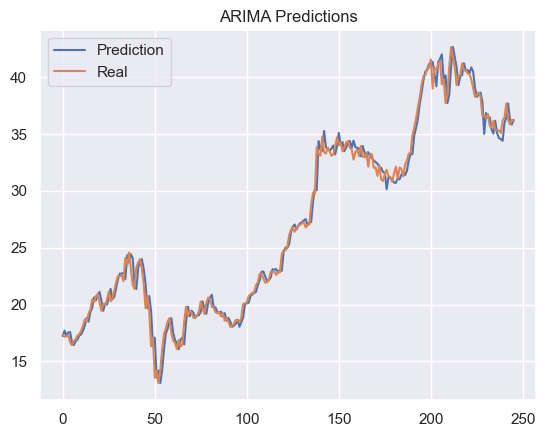

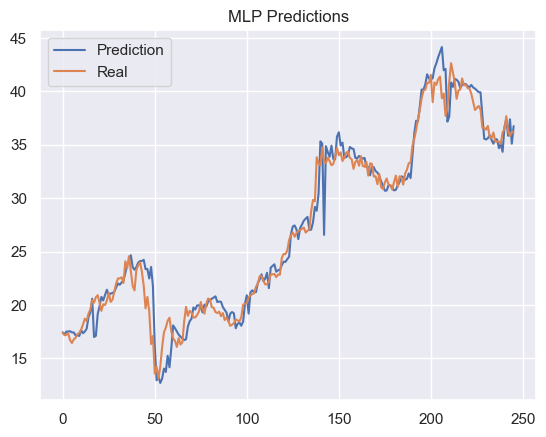

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-7.466, BIC=-1.492, Time=0.218 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-12.741, BIC=-10.749, Time=0.014 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-10.818, BIC=-7.831, Time=0.024 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-10.799, BIC=-7.812, Time=0.027 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=-13.078, BIC=-12.082, Time=0.008 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=-9.783, BIC=-5.800, Time=0.118 seconds
Total fit time: 0.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-2.817, BIC=3.157, Time=0.125 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-9.190, BIC=-7.198, Time=0.022 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-7.763, BIC=-4.776, Time=0.055 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-7.598, BIC=-4.611, Time=0.022 second

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

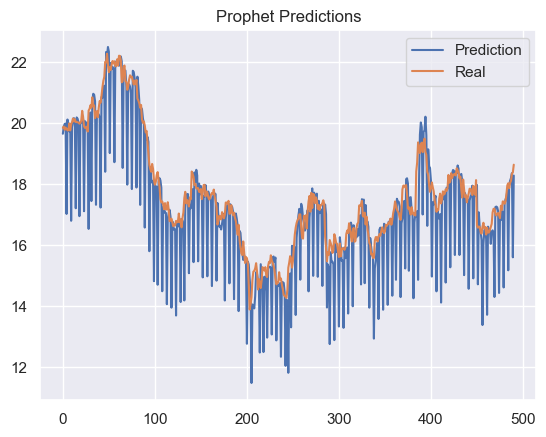

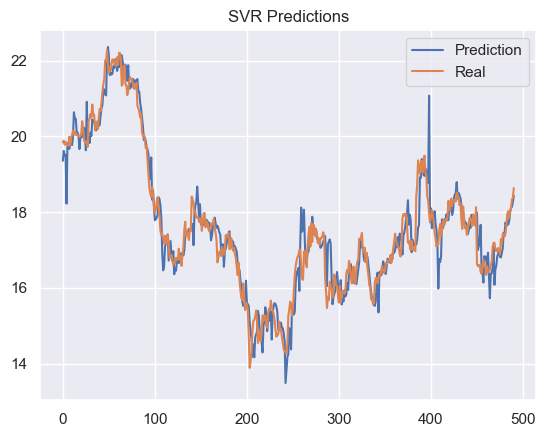

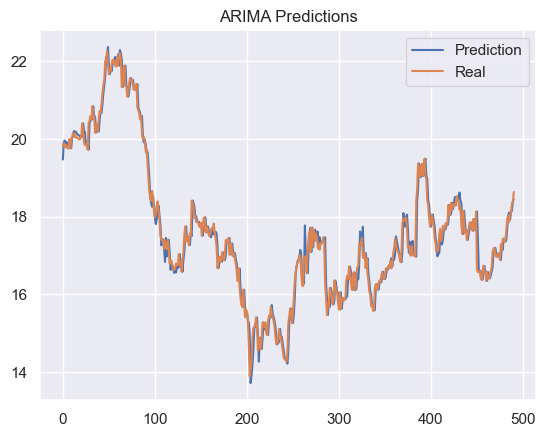

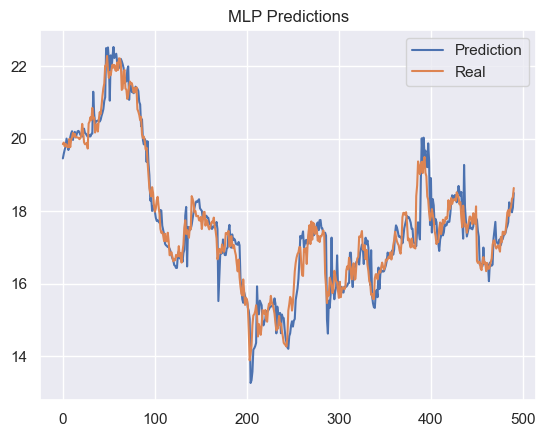

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-35.152, BIC=-29.177, Time=0.350 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-41.918, BIC=-39.926, Time=0.125 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-40.798, BIC=-37.811, Time=0.045 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-40.798, BIC=-37.810, Time=0.070 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=-43.773, BIC=-42.777, Time=0.012 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=-38.802, BIC=-34.819, Time=0.111 seconds
Total fit time: 0.724 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-35.493, BIC=-29.519, Time=0.373 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-42.510, BIC=-40.518, Time=0.032 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-41.221, BIC=-38.234, Time=0.050 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-41.191, BIC=-38.204, Ti

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

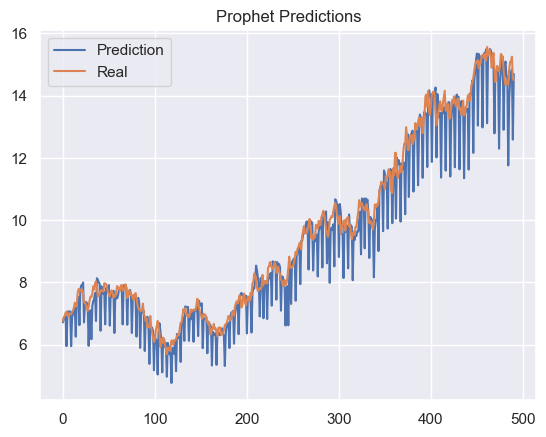

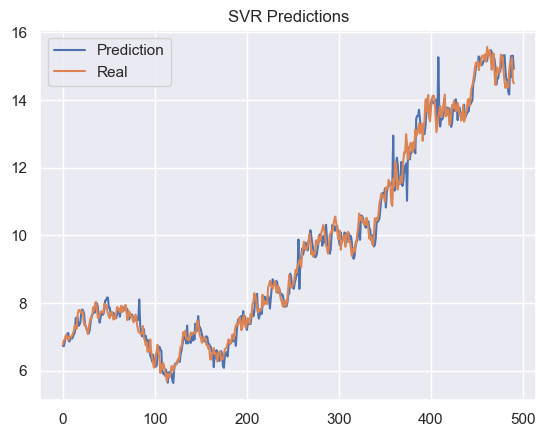

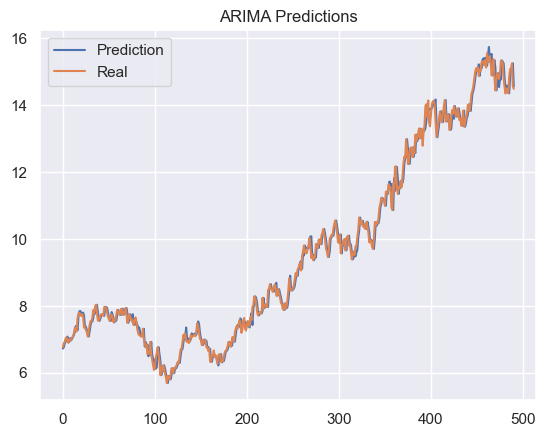

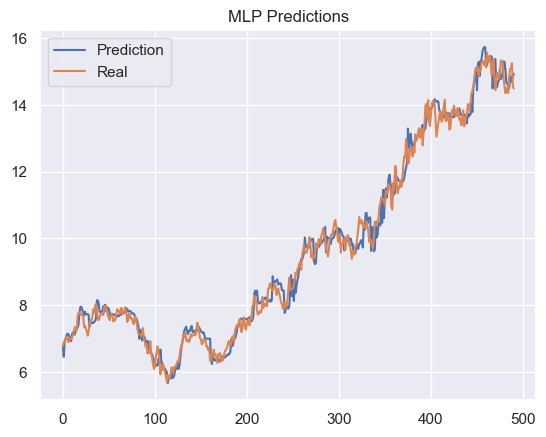

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=2.365, BIC=8.340, Time=0.140 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-3.580, BIC=-1.589, Time=0.010 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-2.321, BIC=0.666, Time=0.019 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-2.393, BIC=0.594, Time=0.021 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=-4.364, BIC=-3.368, Time=0.008 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=-0.587, BIC=3.396, Time=0.057 seconds
Total fit time: 0.255 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=5.499, BIC=11.474, Time=0.068 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-1.388, BIC=0.603, Time=0.009 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=0.391, BIC=3.378, Time=0.019 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=0.396, BIC=3.383, Time=0.020 seconds
Fit ARIMA(0,1,

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

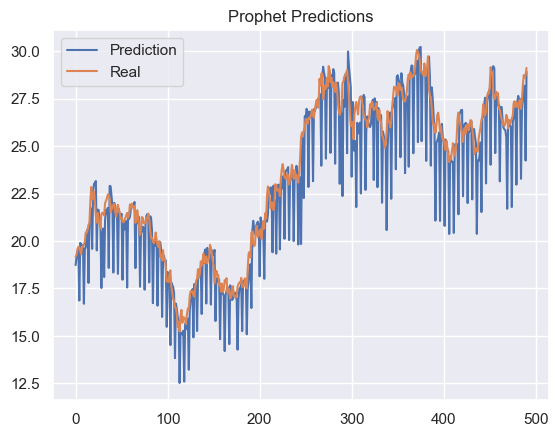

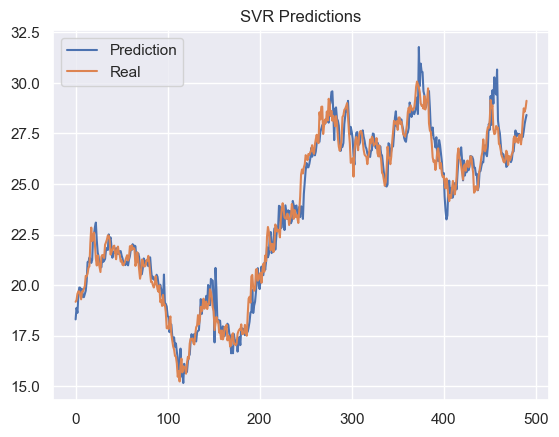

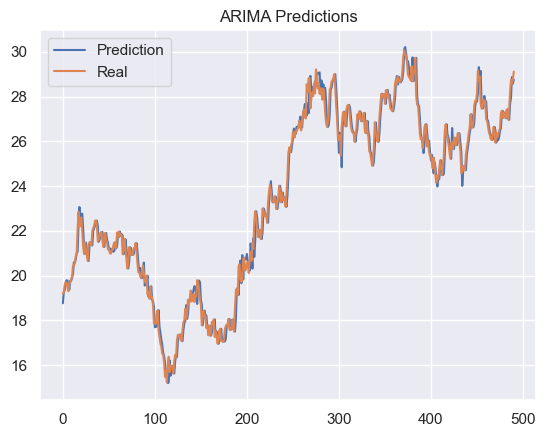

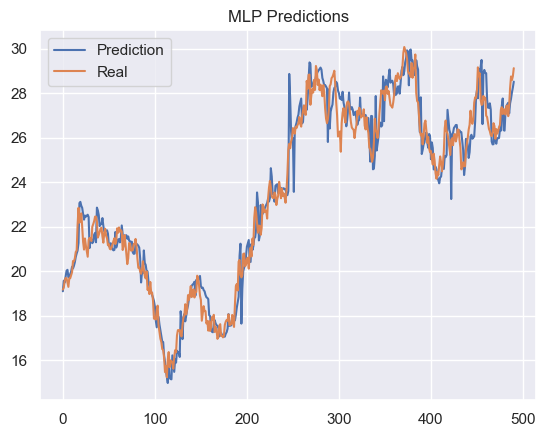

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-33.377, BIC=-27.403, Time=0.176 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-38.292, BIC=-36.301, Time=0.031 seconds
Fit ARIMA(1,1,0)x(0,0,0,0) [intercept=True]; AIC=-36.316, BIC=-33.329, Time=0.038 seconds
Fit ARIMA(0,1,1)x(0,0,0,0) [intercept=True]; AIC=-36.333, BIC=-33.346, Time=0.035 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=False]; AIC=-39.386, BIC=-38.390, Time=0.010 seconds
Fit ARIMA(1,1,1)x(0,0,0,0) [intercept=True]; AIC=-35.046, BIC=-31.063, Time=0.136 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 0.431 seconds
Performing stepwise search to minimize aic
Fit ARIMA(2,1,2)x(0,0,0,0) [intercept=True]; AIC=-30.704, BIC=-24.730, Time=0.185 seconds
Fit ARIMA(0,1,0)x(0,0,0,0) [intercept=True]; AIC=-37.493, BIC=-35.502, Time=0.017 seconds
Fit A

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths o

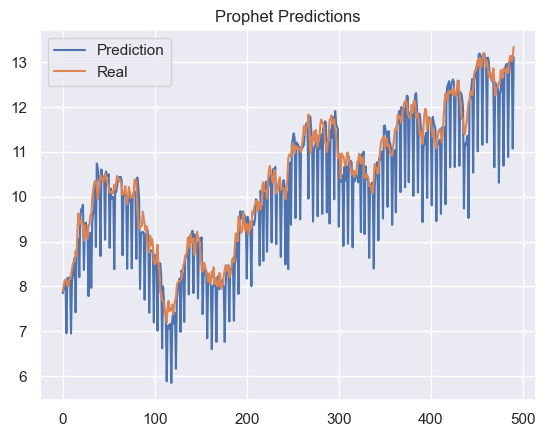

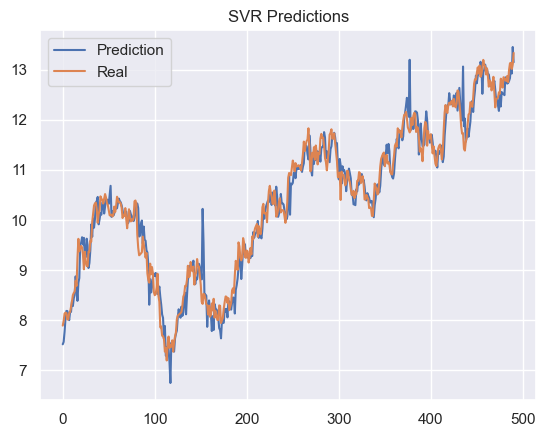

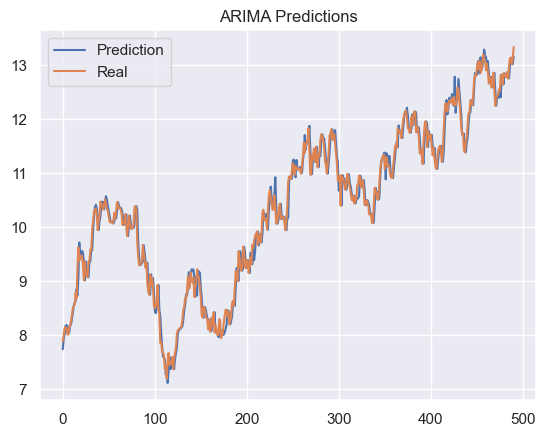

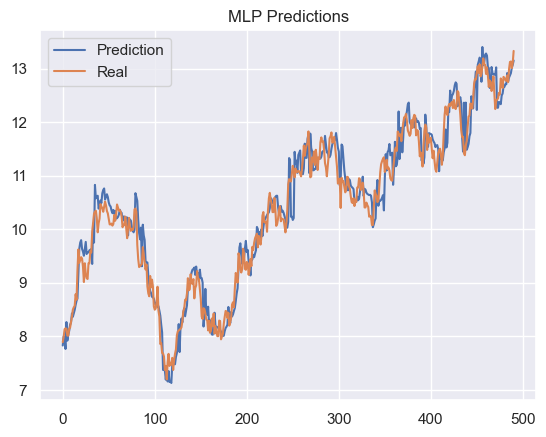

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

KeyboardInterrupt: 

In [34]:
stocks = ["ABEV3", "B3SA3", "BBDC4", "ITSA4", "ITUB4", "MGLU3", "PETR3", "PETR4", "VALE3", "WEGE3"]

date_ranges = [(datetime.datetime(2020, 1, 2), datetime.datetime(2020, 12, 28)), (datetime.datetime(2018, 1, 2), datetime.datetime(2019, 12, 27))]

for start, end in date_ranges:
    t = dates[dates.isin([start])].index.to_list()[0]
    t_f = dates[dates.isin([end])].index.to_list()[0]
    for stock in stocks:
        managers = {
            "Prophet" : StockManager(dates, data[stock], 21, .01, prophet_prediction),
            "SVR" : StockManager(dates, data[stock], 21, .01, svr_prediction),
            "ARIMA" : StockManager(dates, data[stock], 21, .01, arima_prediction),
            "MLP" : StockManager(dates, data[stock], 21, .01, mlp_prediction)
        }

        for manager in managers.values():
            manager.reset(t)
        for manager in managers.values():
            manager.step(t_f - t)

        data_dict = dict()
        for key, manager in managers.items():
            data_dict[f"{key}-return"] = manager.get_return()
            rise, fall, total = manager.get_direction_accuracy()
            rmse, mape, mae = manager.get_errors()
            data_dict[f"{key}-rise-accuracy"] = rise
            data_dict[f"{key}-fall-accuracy"] = fall
            data_dict[f"{key}-total-rise-fall-accuracy"] = total
            data_dict[f"{key}-rmse"] = rmse
            data_dict[f"{key}-mape"] = mape
            data_dict[f"{key}-mae"] = mae
            plt.figure()
            plt.title(f"{key} Predictions")
            manager.plot_predictions(plt)
            plt.savefig(f"{key}-{stock}-{t}-{t_f}-predictions.png")
            plt.show()
        performance_data = pd.DataFrame.from_dict(data_dict, orient="index")
        performance_data.to_csv(f"{stock}-{t}-{t_f}-performance.csv")
    

In [30]:
date = datetime.datetime(2018, 1, 2)
t = dates[dates.isin([date])].index.to_list()[0]

In [27]:
f"{date}"

'2018-01-02 00:00:00'

In [ ]:
t

In [32]:
end_date = datetime.datetime(2019, 12, 27)
t_f = dates[dates.isin([end_date])].index.to_list()[0]

In [49]:
t_f

985

In [50]:
t_f -t

246

In [51]:
prophet_abev_manager.reset(t)

In [52]:
%time prophet_abev_manager.step(10)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to overri

Wall time: 26.7 s


In [53]:
prophet_abev_manager.get_errors()

(1.3242443021436356, 0.04205184657871165, 0.7780135404000001)

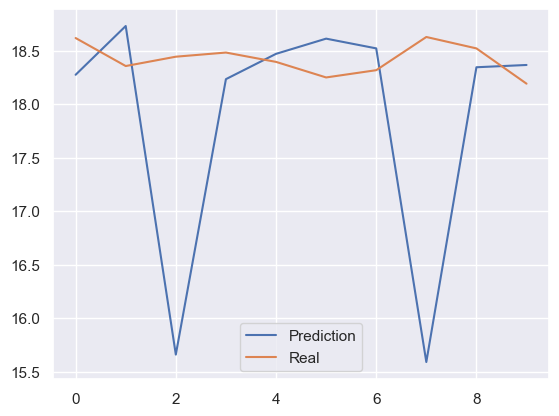

In [54]:
prophet_abev_manager.plot_predictions()

In [437]:
prophet_abev_manager.get_direction_accuracy()

(0.375, 0.6311475409836066)

In [438]:
(prophet_abev_manager.predict_rise + prophet_abev_manager.predict_fall) / (prophet_abev_manager.rise + prophet_abev_manager.fall)

0.5041322314049587

In [439]:
prophet_abev_manager.get_return()

-0.016440014589643066

In [230]:
prophet_abev_manager.error

0.005556237999996938

In [365]:
prophet_abev_manager.predict_rise

98

In [366]:
prophet_abev_manager.rise

230

In [367]:
prophet_abev_manager.predictions

[19.6514,
 19.8979,
 19.9707,
 19.9857,
 17.0208,
 20.1184,
 19.7883,
 19.7282,
 19.9128,
 16.7966,
 19.8694,
 20.0307,
 20.1641,
 20.1054,
 17.2075,
 20.187,
 20.1466,
 20.0256,
 16.948,
 19.9681,
 20.0135,
 20.0423,
 20.1303,
 17.11,
 20.065,
 19.9722,
 20.0203,
 19.7096,
 16.5299,
 20.2031,
 20.3482,
 17.4438,
 20.7185,
 20.9628,
 20.932,
 20.7186,
 17.321,
 20.3445,
 20.2921,
 20.2875,
 20.1749,
 17.2298,
 20.8558,
 20.8298,
 21.0888,
 21.2268,
 18.4048,
 22.3344,
 22.2187,
 22.4972,
 22.3433,
 19.0177,
 21.9729,
 21.7725,
 21.8472,
 21.7681,
 18.7185,
 21.9872,
 22.0276,
 21.9936,
 21.9948,
 21.88,
 22.1505,
 22.1866,
 22.025,
 18.5313,
 21.5355,
 21.7059,
 21.7254,
 21.2102,
 17.9824,
 21.2753,
 21.2713,
 21.2023,
 20.9782,
 17.8377,
 21.7179,
 21.6787,
 21.4749,
 21.1781,
 17.8871,
 21.5236,
 21.213,
 20.7532,
 17.3182,
 20.505,
 20.453,
 20.1548,
 19.9873,
 16.5739,
 19.7134,
 19.4662,
 19.5453,
 19.3853,
 15.7981,
 18.5494,
 18.1716,
 18.0501,
 18.1032,
 14.8149,
 18.0593,
 17

In [10]:
data

,Date,ABEV3,B3SA3,BBDC4,ITSA4,ITUB4,MGLU3,PETR3,PETR4,VALE3,WEGE3,IBOV,IBRX100,SELIC
0,2017-01-02,14.513428,4.707792,13.959736,5.574284,17.673601,0.387862,15.414226,13.170212,20.634165,5.441369,59588.00,24538.00,13.65
1,2017-01-03,14.807078,4.901540,14.550979,5.818710,18.422081,0.386680,16.393351,13.924849,21.548129,5.715239,61813.00,25419.00,13.65
2,2017-01-04,14.691398,4.994076,14.458823,5.852659,18.501145,0.366088,16.197526,13.924849,21.161135,5.578304,61589.00,25352.00,13.65
3,2017-01-05,14.771484,4.933349,14.618883,5.906976,18.754152,0.378672,16.561201,14.149443,21.968058,5.563890,62070.00,25546.00,13.65
4,2017-01-06,14.646905,4.930457,14.711040,5.886607,18.817404,0.376231,16.309426,14.068589,21.383450,5.610736,61665.00,25375.00,13.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1078,2021-05-17,17.400000,17.580000,25.000000,10.650000,28.980000,18.860000,25.940000,26.660000,113.460000,32.170000,122937.87,53099.86,2.65
1079,2021-05-18,17.420000,17.300000,25.400000,10.620000,28.920000,18.970000,25.600000,26.350000,114.600000,32.400000,122979.96,53179.99,2.65
1080,2021-05-19,17.560000,17.220000,25.570000,10.740000,29.130000,18.680000,25.520000,26.150000,112.250000,31.600000,122636.30,52909.02,2.65
1081,2021-05-20,17.540000,17.250000,25.810000,10.780000,29.290000,18.740000,25.170000,25.930000,111.110000,31.860000,122700.79,52908.84,2.65


In [12]:
import datetime


In [10]:
dates

0      2017-01-02
1      2017-01-03
2      2017-01-04
3      2017-01-05
4      2017-01-06
          ...    
1078   2021-05-17
1079   2021-05-18
1080   2021-05-19
1081   2021-05-20
1082   2021-05-21
Name: Date, Length: 1083, dtype: datetime64[ns]

In [22]:
t = dates[dates.isin([date])].index.tolist()[0]

In [23]:
t

1082

In [26]:
import datetime
period = 21
date = datetime.datetime(2021, 5, 21)
t = dates[dates.isin([date])].index.tolist()[0]



INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:n_changepoints greater than number of observations. Using 15.


In [28]:
predictions["yhat"]

21    17.96135
Name: yhat, dtype: float64

In [33]:
y[t - 1]

17.54

In [9]:
data["estado"] = data["estado"].fillna("Brasil")
data["municipio"] = data["municipio"].fillna("State Data")
data["codmun"] = data["codmun"].fillna("State Data")

In [10]:
data

,regiao,estado,municipio,coduf,codmun,codRegiaoSaude,nomeRegiaoSaude,data,semanaEpi,populacaoTCU2019,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos,interior/metropolitana
0,Brasil,Brasil,State Data,76.0,State Data,NaN,NaN,2020-02-25,9.0,210147125.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
1,Brasil,Brasil,State Data,76.0,State Data,NaN,NaN,2020-02-26,9.0,210147125.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN
2,Brasil,Brasil,State Data,76.0,State Data,NaN,NaN,2020-02-27,9.0,210147125.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN
3,Brasil,Brasil,State Data,76.0,State Data,NaN,NaN,2020-02-28,9.0,210147125.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN
4,Brasil,Brasil,State Data,76.0,State Data,NaN,NaN,2020-02-29,9.0,210147125.0,2.0,1.0,0.0,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1082950,Sudeste,SP,Ibiúna,35.0,351970.0,35163.0,SOROCABA,2020-05-30,22.0,78878.0,73.0,0.0,3.0,0.0,NaN,NaN,0.0
1082951,Sudeste,SP,Ibiúna,35.0,351970.0,35163.0,SOROCABA,2020-05-31,23.0,78878.0,73.0,0.0,3.0,0.0,NaN,NaN,0.0
1082952,Sudeste,SP,Ibiúna,35.0,351970.0,35163.0,SOROCABA,2020-06-01,23.0,78878.0,73.0,0.0,3.0,0.0,NaN,NaN,0.0
1082953,Sudeste,SP,Ibiúna,35.0,351970.0,35163.0,SOROCABA,2020-06-02,23.0,78878.0,75.0,2.0,3.0,0.0,NaN,NaN,0.0


In [11]:
data[["regiao", "estado", "municipio", "coduf", "codmun", "casosAcumulado"]]

,regiao,estado,municipio,coduf,codmun,casosAcumulado
0,Brasil,Brasil,State Data,76.0,State Data,0.0
1,Brasil,Brasil,State Data,76.0,State Data,1.0
2,Brasil,Brasil,State Data,76.0,State Data,1.0
3,Brasil,Brasil,State Data,76.0,State Data,1.0
4,Brasil,Brasil,State Data,76.0,State Data,2.0
...,...,...,...,...,...,...
1082950,Sudeste,SP,Ibiúna,35.0,351970.0,73.0
1082951,Sudeste,SP,Ibiúna,35.0,351970.0,73.0
1082952,Sudeste,SP,Ibiúna,35.0,351970.0,73.0
1082953,Sudeste,SP,Ibiúna,35.0,351970.0,75.0


In [12]:
brazil_data = data[data["estado"] == "RR"]
brazil_data = brazil_data[brazil_data["municipio"] == "State Data"].reset_index()
brazil_data = brazil_data[brazil_data["codmun"] == "State Data"].reset_index()
brazil_data

,level_0,index,regiao,estado,municipio,coduf,codmun,codRegiaoSaude,nomeRegiaoSaude,data,semanaEpi,populacaoTCU2019,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos,interior/metropolitana
0,0,1350,Norte,RR,State Data,14.0,State Data,NaN,NaN,2020-02-25,9.0,605761.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
1,1,1351,Norte,RR,State Data,14.0,State Data,NaN,NaN,2020-02-26,9.0,605761.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
2,2,1352,Norte,RR,State Data,14.0,State Data,NaN,NaN,2020-02-27,9.0,605761.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
3,3,1353,Norte,RR,State Data,14.0,State Data,NaN,NaN,2020-02-28,9.0,605761.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
4,4,1354,Norte,RR,State Data,14.0,State Data,NaN,NaN,2020-02-29,9.0,605761.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
332,332,1682,Norte,RR,State Data,14.0,State Data,NaN,NaN,2021-01-22,3.0,605761.0,71740.0,157.0,819.0,0.0,NaN,NaN,NaN
333,333,1683,Norte,RR,State Data,14.0,State Data,NaN,NaN,2021-01-23,3.0,605761.0,72127.0,387.0,821.0,2.0,NaN,NaN,NaN
334,334,1684,Norte,RR,State Data,14.0,State Data,NaN,NaN,2021-01-24,4.0,605761.0,72313.0,186.0,821.0,0.0,NaN,NaN,NaN
335,335,1685,Norte,RR,State Data,14.0,State Data,NaN,NaN,2021-01-25,4.0,605761.0,72462.0,149.0,821.0,0.0,NaN,NaN,NaN


In [13]:

brazil_data[["regiao", "estado", "municipio", "coduf", "codmun", "casosAcumulado"]]

,regiao,estado,municipio,coduf,codmun,casosAcumulado
0,Norte,RR,State Data,14.0,State Data,0.0
1,Norte,RR,State Data,14.0,State Data,0.0
2,Norte,RR,State Data,14.0,State Data,0.0
3,Norte,RR,State Data,14.0,State Data,0.0
4,Norte,RR,State Data,14.0,State Data,0.0
...,...,...,...,...,...,...
332,Norte,RR,State Data,14.0,State Data,71740.0
333,Norte,RR,State Data,14.0,State Data,72127.0
334,Norte,RR,State Data,14.0,State Data,72313.0
335,Norte,RR,State Data,14.0,State Data,72462.0


In [6]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn import svm

import matplotlib.pyplot as plt
import six
import joblib
import sys
sys.modules['sklearn.externals.six'] = six
sys.modules['sklearn.externals.joblib'] = joblib
import pmdarima as pm
from fbprophet import Prophet

# constants
kernel = ['poly','sigmoid','rbf']
C = [0.01, 0.025, 0.05, 0.075, 0.1, 0.25, 0.5, 0.75, 1, 2.5, 5, 7.5, 10]
gamma = ["scale", "auto", 0.01, 0.025, 0.05, 0.075, 0.1, 0.25, 0.5, .75, 1]
epsilon = [0.01, 0.025, 0.05, 0.075, 0.1, .25, 0.5, .75, 1]
shrinking = [True, False]
svm_grid = {'kernel':kernel,'C':C,'gamma':gamma,'epsilon':epsilon,'shrinking':shrinking}
SVM = svm.SVR()
svm_search = GridSearchCV(SVM,svm_grid,cv=3)

def svr_test(x, y, plot):
    
    # scale the data with a standard scaler
    combined = [[x[i], y[i]] for i in range(len(x))]
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(combined)
    
    # get training data
    x_train, y_train = scaled_data[-28:-14, 0], scaled_data[-28:-14, 1]
    
    # separate columns
    x_data, y_data = scaled_data[:, 0], scaled_data[:, 1] 
    
    # fit SVM Model
    svm_search.fit(x_train.reshape(-1, 1), y_train)
    svm_final = svm_search.best_estimator_
    
    # reverse the previous scale
    combined_output = [[x_data[i], svm_final.predict(x_data.reshape(-1, 1))[i]] for i in range(len(x_data))]
    output = scaler.inverse_transform(combined_output)
    
    # get outputs
    output_x = output[:, 0]
    output_y = output[:, 1]
    
    # plot data
    plot.plot(output_x[-14:], output_y[-14:], label  = "SVR Prediction", linewidth = 2.5, color='#88CCEE')
    
    # calculate metrics
    rmse = mean_squared_error(y[-14:], output_y[-14:], squared = False)
    mape = mean_absolute_percentage_error(y[-14:], output_y[-14:])
    return rmse, mape
    
def auto_arima(y, plt):
    # splits data into training and testing
    train, test =  y[:-14], y[:14]
    
    # declares auto-arima model and trains it on the training data
    model = pm.auto_arima(train, seasonal=False, m=12)
    
    # forecasts the next two weeks
    forecasts = model.predict(test.shape[0])
    
    # adds forecast as a line onto the main plot
    plt.plot(x[-14:], forecasts, label = "ARIMA Prediction", linewidth = 2.5, color='#117733')
    
    # calculates error metrics
    rmse = mean_squared_error(y[-14:], forecasts, squared = False)
    mape = mean_absolute_percentage_error(y[-14:], forecasts)
    
    # returns calculated metrics
    return rmse, mape
def prophet_test(dates, y, plt):
    m = Prophet()
    m.fit(pd.DataFrame({"ds": dates[:-14], "y" : y[:-14]}))
    m.make_future_dataframe(periods=14)
    predictions = m.predict(m.make_future_dataframe(periods=14))[-14:]
    plt.plot(predictions.index, predictions['yhat'], label = "Prophet Prediction", linewidth = 2.5, color='#661100')
    rmse = mean_squared_error(y[-14:], predictions['yhat'], squared = False)
    mape = mean_absolute_percentage_error(y[-14:], predictions['yhat'])
    return rmse, mape

Importing plotly failed. Interactive plots will not work.


In [7]:
test_data = data[data["estado"] == "RO"].reset_index()
test_data = test_data[test_data["municipio"] == "State Data"]
test_data = test_data[test_data["codmun"] == "State Data"].reset_index()

In [8]:
x, y = test_data.index, test_data["casosAcumulado"]


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


(8708.538909418896, 0.07286309527629833)

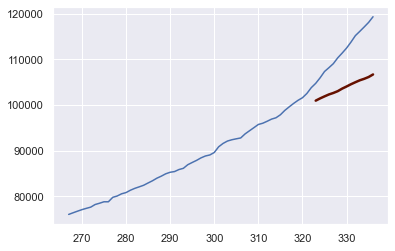

In [17]:
plt.plot(x[-70:], y[-70:], label = "Real Data")
prophet_test(test_data["data"], y, plt)

(3140.7255581229256, 0.025148338153393613)

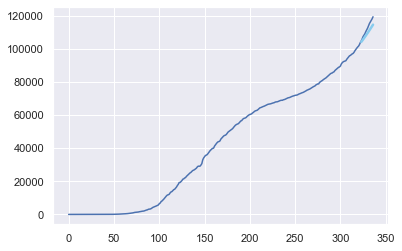

In [10]:
plt.plot(x, y, label = "Real Data")
svr_test(x, y, plt)

C:\Users\piphi\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\Users\piphi\anaconda3\envs\covidprediction\lib\site-packages\pmdarima\arima\_auto_solvers.py:207: ModelFitWarning: Unable to fit ARIMA for or

(2846.090953822347, 0.021379381539264795)

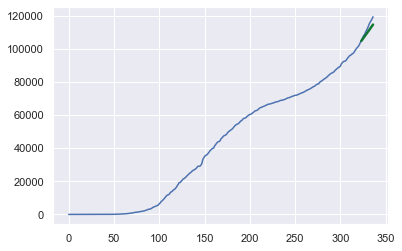

In [11]:
plt.plot(x, y, label = "Real Data")
auto_arima(y, plt)

In [12]:
def setup_plot(plt, title, y_label):
    plt.title(title)
    plt.legend()
    plt.ylim(bottom=0)
    plt.xlabel("Days from Start")
    plt.gca().xaxis.grid(True)
    plt.grid(axis = "both", linestyle = "dotted", which = "both")
    plt.ylabel(y_label)
    plt.tight_layout()
    plt.rc("savefig", dpi=300)
    return plt
plt.clf()



<Figure size 432x288 with 0 Axes>

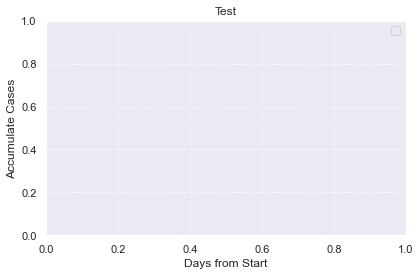

In [13]:
setup_plot(plt, "Test", "Accumulate Cases")
plt.savefig("test.png")

In [18]:
variables_of_interest = {
    "Accumulated Cases" : "casosAcumulado",
    "Deaths" : "obitosAcumulado"
}


areas_of_interest = data["estado"].unique()

df = pd.DataFrame()
# Runs for every stored area of interest (Brazil, 26 states, federal district)
for state in areas_of_interest:
    # Get only the statewide/countrywide data
    temp_data = data[data["estado"] == state]
    temp_data = temp_data[temp_data["municipio"] == "State Data"]
    temp_data = temp_data[temp_data["codmun"] == "State Data"].reset_index()
    
    # Get the case data and time data
    x, y = temp_data.index.values, temp_data["casosAcumulado"]
    
    # Setup the time series plot and plot the real data 10 weeks from the end
    plt.clf()
    plt.plot(x[-70:], y[-70:], label = "Real Data", color = "#CC6677", linewidth = 2.5)
    setup_plot(plt, f"{state} Test", "Accumulated Cases")
    
    # Train and run analysis of the 3 algorithms
    svr_rmse, svr_mape = svr_test(x, y, plt)
    arima_rmse, arima_mape = auto_arima(y, plt)
    prophet_rmse, prophet_mape = prophet_test(temp_data["data"], y, plt)
    
    # Add the legend and save the graph as a png
    plt.legend(loc="upper left")
    plt.savefig(f"{state}-test.png")
    plt.close()
    
    # Store the calculated metrics
    out_data = {"State" : state,
        "RMSE SVR" : svr_rmse,
        "MAPE SVR" : svr_mape,
        "RMSE ARIMA" : arima_rmse,
        "MAPE ARIMA" : arima_mape,
        "RMSE Prophet" : prophet_rmse,
        "MAPE Prophet" : prophet_mape
       }
    row = pd.Series(out_data, index = out_data.keys())
    df = pd.concat([df, row.to_frame().transpose()])
    

C:\Users\piphi\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\Users\piphi\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARM

In [19]:
df

,State,RMSE SVR,MAPE SVR,RMSE ARIMA,MAPE ARIMA,RMSE Prophet,MAPE Prophet
0,Brasil,26586.127321,0.002257,47298.220514,0.005155,152703.160373,0.016562
0,RO,3140.725558,0.025148,2846.090954,0.021379,8708.538909,0.072863
0,AC,787.768041,0.016157,707.390583,0.014142,275.302038,0.005175
0,AM,10890.438351,0.041163,4312.242627,0.015388,23802.275517,0.093191
0,RR,1277.209124,0.016549,601.889641,0.007214,903.125942,0.012537
0,PA,3657.056355,0.010948,551.5732,0.001529,6516.089502,0.019307
0,AP,343.856491,0.004201,275.050109,0.002852,461.224318,0.006023
0,TO,1571.187423,0.01526,444.625562,0.004126,2228.642973,0.021393
0,MA,2921.767756,0.013255,850.350027,0.003457,1240.003805,0.005994
0,PI,1874.934299,0.011926,234.418206,0.001351,745.526016,0.004287


In [92]:
df.to_csv("Output.csv")

In [93]:
analysis_types = ["RMSE", "MAPE"]

analysis_dict = {column : 0 for column in df.columns if column != "State"}

for analysis_type in analysis_types:
    target_columns = [column for column in df.columns if analysis_type in column]
    for index, row in df.iterrows():
        numbers_dict = {}
        num_list = []
        for column in target_columns:
            num = row[column]
            numbers_dict[num] = column
            num_list.append(num)
        analysis_dict[numbers_dict[min(num_list)]] += 1
    
    
    
    
    
    

In [94]:
analysis_dict

{'RMSE SVR': 2,
 'MAPE SVR': 3,
 'RMSE ARIMA': 20,
 'MAPE ARIMA': 21,
 'RMSE Prophet': 6,
 'MAPE Prophet': 4}

In [95]:
updated_dict = {key : analysis_dict[key] for key in sorted(analysis_dict.keys())}

updated_dict

{'MAPE ARIMA': 21,
 'MAPE Prophet': 4,
 'MAPE SVR': 3,
 'RMSE ARIMA': 20,
 'RMSE Prophet': 6,
 'RMSE SVR': 2}

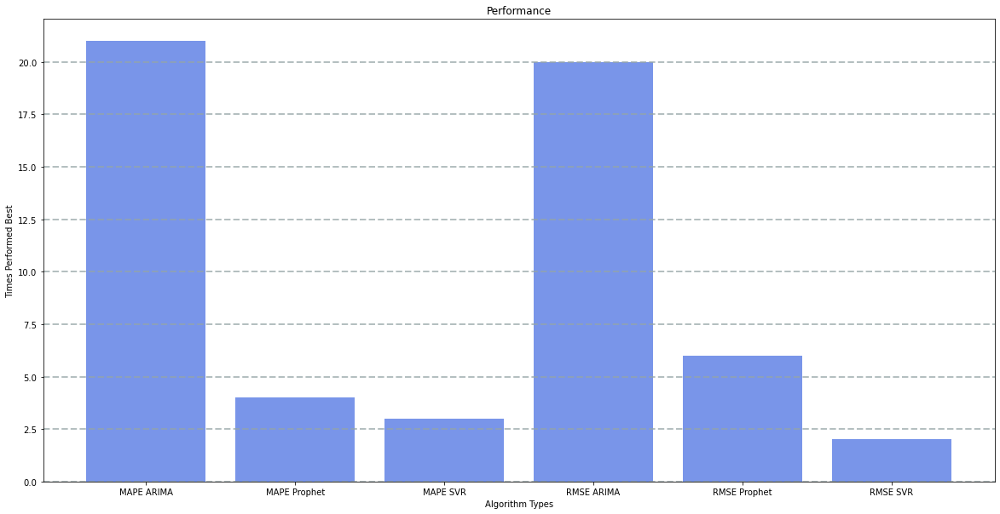

In [96]:
plt.figure(figsize=(20,10))
plt.title("Performance")
plt.bar(updated_dict.keys(), updated_dict.values(), color='royalblue', alpha=0.7)
plt.grid(color='#95a5a6', linestyle='--', linewidth=2, axis='y', alpha=0.7)
plt.xlabel("Algorithm Types")
plt.ylabel("Times Performed Best")
plt.savefig("Performance.png", dpi=300)

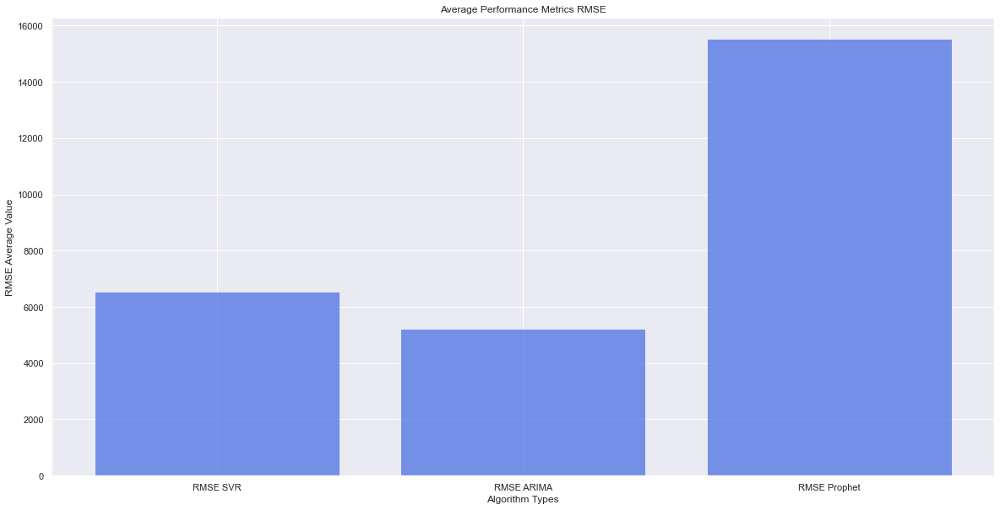

In [21]:
plt.figure(figsize=(20,10))
plt.title("Average Performance Metrics RMSE")
for column in [col for col in df.columns if "RMSE" in col]:
    plt.bar(column, np.mean(df[column]), color='royalblue', alpha=0.7)

plt.xlabel("Algorithm Types")
plt.ylabel("RMSE Average Value")
plt.savefig("RMSEMeananalysis.png", dpi=300)

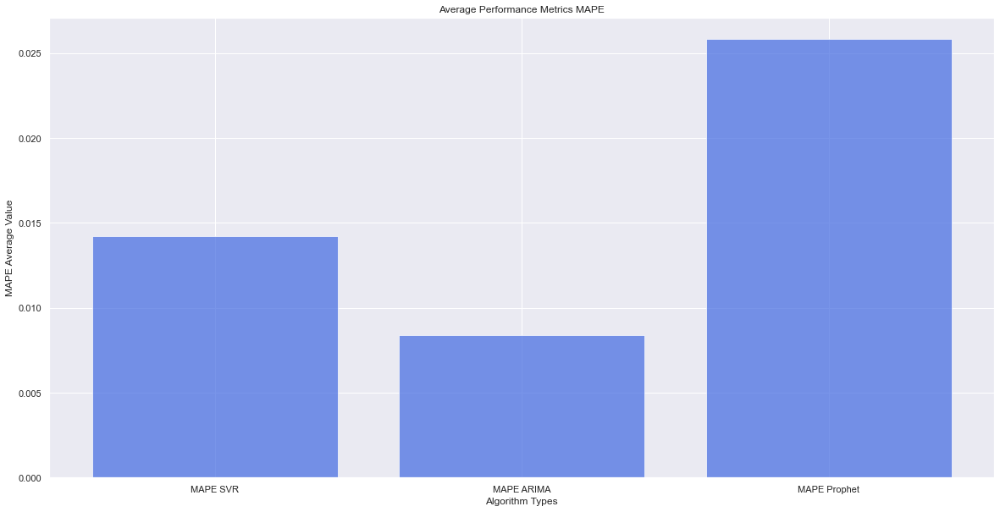

In [22]:
plt.figure(figsize=(20,10))
plt.title("Average Performance Metrics MAPE")
for column in [col for col in df.columns if "MAPE" in col]:
    plt.bar(column, np.mean(df[column]), color='royalblue', alpha=0.7)

plt.xlabel("Algorithm Types")
plt.ylabel("MAPE Average Value")
plt.savefig("MAPEMeananalysis.png", dpi=300)

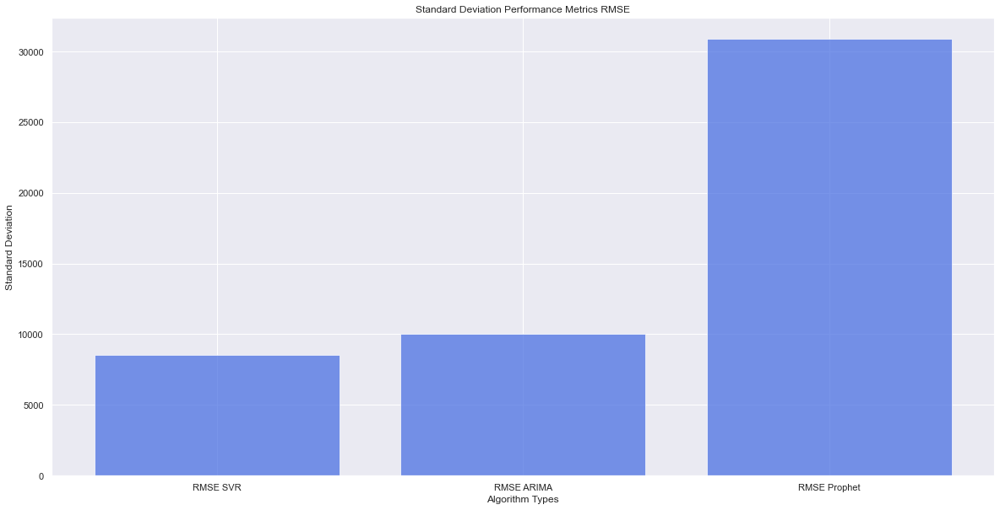

In [23]:
plt.figure(figsize=(20,10))
plt.title("Standard Deviation Performance Metrics RMSE")
for column in [col for col in df.columns if "RMSE" in col]:
    plt.bar(column, np.std(df[column]), color='royalblue', alpha=0.7)

plt.xlabel("Algorithm Types")
plt.ylabel("Standard Deviation")
plt.savefig("stddevRMSEanalysis.png", dpi=300)

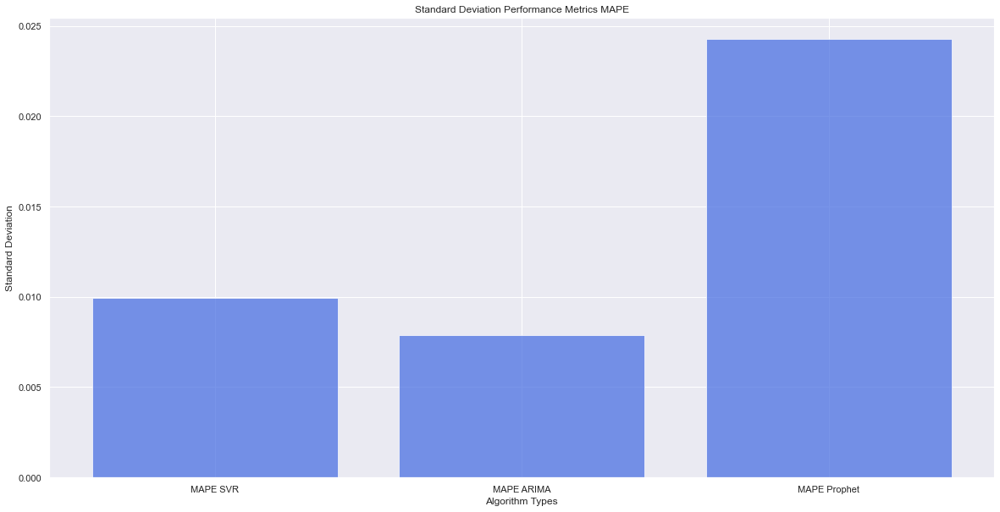

In [24]:
plt.figure(figsize=(20,10))
plt.title("Standard Deviation Performance Metrics MAPE")
for column in [col for col in df.columns if "MAPE" in col]:
    plt.bar(column, np.std(df[column]), color='royalblue', alpha=0.7)

plt.xlabel("Algorithm Types")
plt.ylabel("Standard Deviation")
plt.savefig("stddevMAPEanalysis.png", dpi=300)

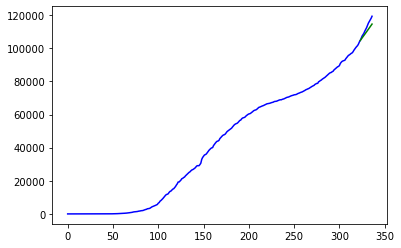

In [19]:
import matplotlib.pyplot as plt
plt.plot(x, y, c='blue')

plt.show()

In [22]:

y

0           0.0
1           0.0
2           0.0
3           0.0
4           0.0
         ...   
332    115200.0
333    116133.0
334    117101.0
335    118097.0
336    119336.0
Name: casosAcumulado, Length: 337, dtype: float64

C:\Users\piphi\AppData\Roaming\Python\Python37\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)
C:\Users\piphi\anaconda3\envs\covidprediction\lib\site-packages\pmdarima\arima\_auto_solvers.py:207: ModelFitWarning: Unable to fit ARIMA for or

(2846.090953822347, 0.021379381539264795)

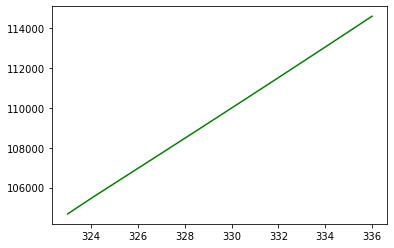